In [1]:
run '../__init__.py'

(CVXPY) Nov 29 12:22:36 PM: Encountered unexpected exception importing solver SCS:
ImportError("dlopen(/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/_scs_direct.cpython-310-darwin.so, 0x0002): Library not loaded: @rpath/liblapack.3.dylib\n  Referenced from: <EA245032-41C7-30EA-BA1A-C55492696949> /Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/_scs_direct.cpython-310-darwin.so\n  Reason: tried: '/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/../../liblapack.3.dylib' (no such file), '/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/../../liblapack.3.dylib' (no such file), '/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/bin/../lib/liblapack.3.dylib' (no such file), '/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/bin/../lib/liblapack.3.dylib' (no such file), '/usr/local/lib/liblapack.3.dylib' (no such file), '/usr/lib/liblapack.3.dylib' (no such file, not in d

In [29]:
import pickle

import numpy as np
import pandas as pd
import plotly.express as px

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima

# Forecast of Chelsea Parking Volumes

https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8888199

the number of vehicle
arrivals for Richards Ave station near downtown Davis [see
Fig. 3(b)] [24]. The data of arrivals are the total number of the
passing-by vehicles. We use the scaled number of arrivals to
model the number of EVs that enter the charging station

**Goals:**
1. Fit a model to conduct short-term (day-ahead) forecasts at hourly granularity:
2. Use forecasted arrival times and an assumed parking duration to forecast demand

*Why hourly?*

Generally, participants in RTP programs pay for energy at a rate that is linked to the hourly market price for electricity. Participants are made aware of the hourly prices on either a day-ahead or hour-ahead basis. Typically, only the largest customers (generally above one megawatt of load) face hour ahead prices.

In [2]:
with open('../../data_transformed/chelsea_parking_vol.pkl', 'rb') as pickle_file:
    P = pickle.load(pickle_file)

array([[<Axes: title={'center': 'P'}>]], dtype=object)

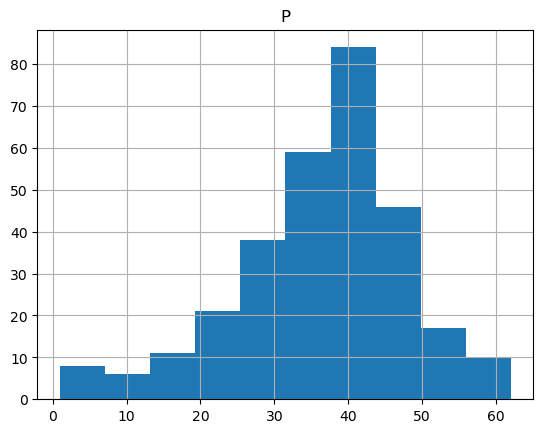

In [7]:
P.hist(bins=10)

## EDA

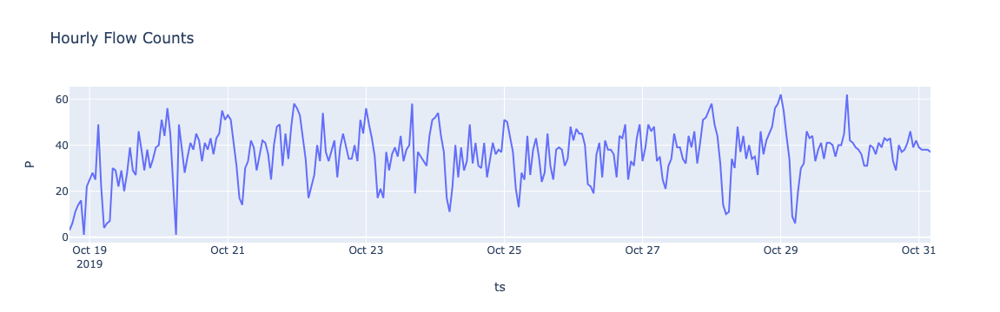

In [12]:
px.line(P, y='P', title='Hourly Flow Counts')

**Trend-Seasonal-Resdiual Decomposition**

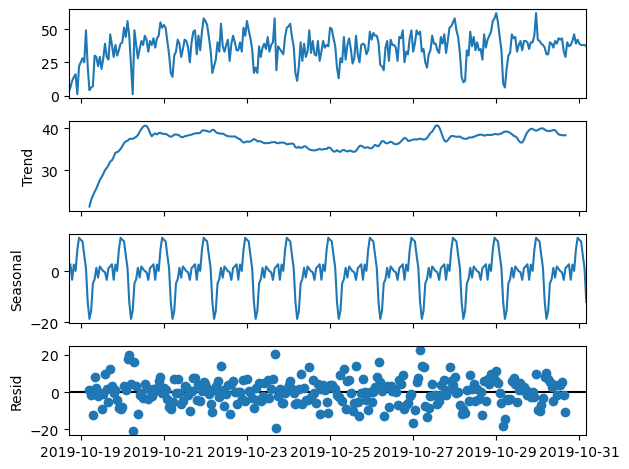

In [13]:
fig = seasonal_decompose(P).plot()

Because the data is encoded on an hourly basis:
- Seasonal trend plot just captures daily fluctuations
- Trend plot is still muddied by weekly periodic cycle
    - However, we can tell via observations there isn't much of an overarching trend that would induce non-stationarity

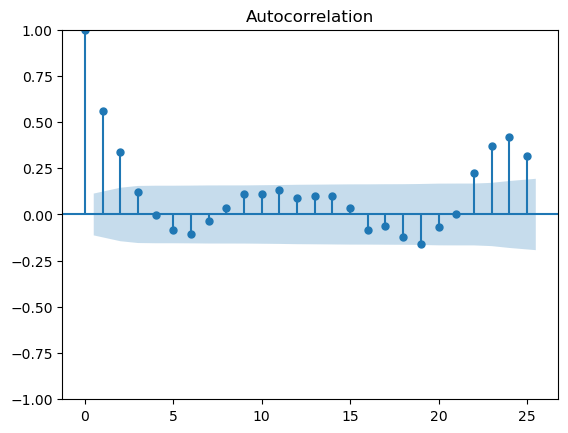

In [15]:
fig = plot_acf(P)

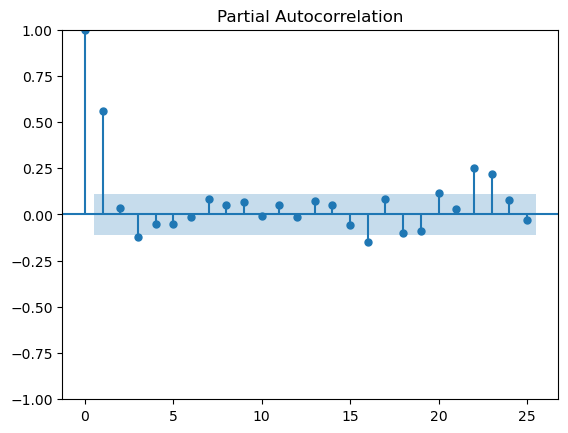

In [16]:
fig = plot_pacf(P)

In [19]:
# result = adfuller(P)
# print('ADF Statistic: %f' % result[0])
# print('p-value: %f' % result[1])
# print('Critical Values:')
# for key, value in result[4].items():
# 	print('\t%s: %.3f' % (key, value))

## Preprocessing
- Train-test split
- Adding Exogenous variables (`X`)

,flow
ts,
2019-10-18 17:00:00,3.0
2019-10-18 18:00:00,6.0
2019-10-18 19:00:00,11.0
2019-10-18 20:00:00,14.0
2019-10-18 21:00:00,16.0
...,...
2019-10-31 00:00:00,39.0
2019-10-31 01:00:00,38.0
2019-10-31 02:00:00,38.0


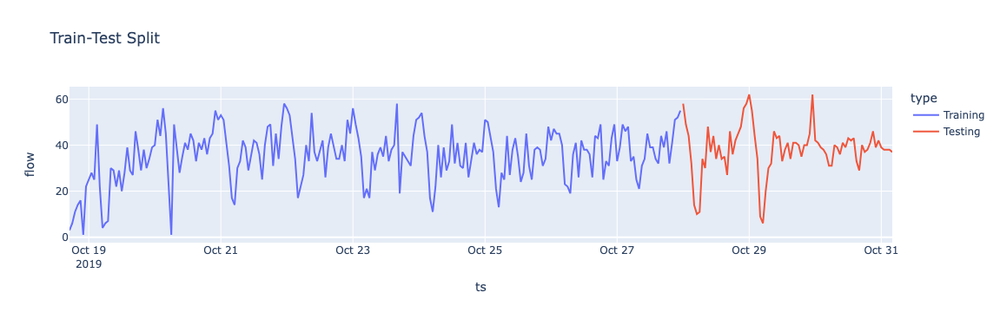

In [36]:
cutoff_date = pd.Timestamp('2019-10-28')

df = P.rename(columns={'P':'flow'}).copy()
df['type'] = 'Training'
df.loc[df.index >= cutoff_date, 'type'] = 'Testing'
px.line(df, color='type', y='flow',
        title='Train-Test Split')

In [37]:
add_feats = ['mean', 'std']
df = pd.concat([df, df.flow.rolling(6).agg(add_feats)], axis=1).dropna()

In [38]:
train = df[df.type=="Training"]
test = df[df.type=="Testing"]

### Helpers

In [40]:
def validate_arima(model, base_df, train, test, exog_vars):
    
    training_fit = pd.DataFrame(model.predict_in_sample(train[exog_vars]),
                                index=train.index, columns=['flow'])
    training_fit['type'] = "Fit"
    
    predict = pd.DataFrame(model.predict(n_periods=len(test),
                                     X=test[exog_vars]),
                       index=test.index, columns=['flow'])
    predict['type'] = "Predicted"
    
    validate = pd.concat([base_df, training_fit, predict])
    
    fig = px.line(validate, y='flow', color='type',
                  title=f'ARIMA{model.get_params()["order"]}{model.get_params()["seasonal_order"]}')
    
    print("RMSE:", np.sqrt(((test.flow - predict.flow)**2).mean()))
    print("MAE:", abs(test.flow - predict.flow).mean())
    
    return validate, predict, fig
    

## ARIMAX

X => exogenous variables

In [41]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1614.709, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1662.928, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1611.172, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1623.763, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2202.904, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1613.036, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1613.073, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1614.607, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1668.315, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.421 seconds


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

In [42]:
# model.summary()

### Validation

RMSE: 10.484052697555882
MAE: 7.495161961887269


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

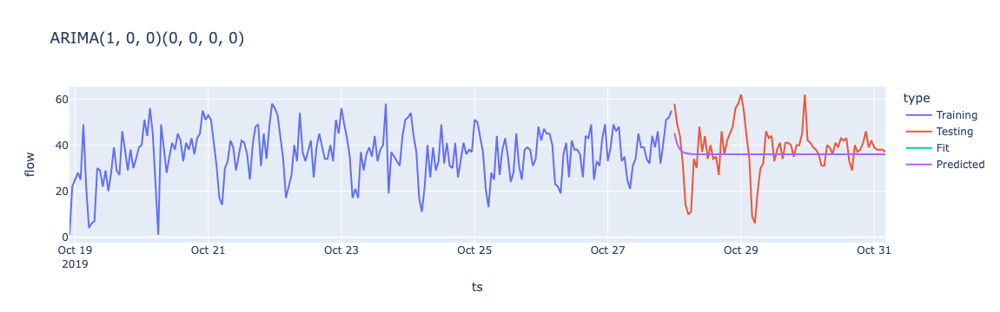

In [43]:
validate, predict, fig = validate_arima(model, df, train, test, add_feats)
fig

RMSE: 42.59839104426795
MAE: 34.296882750717444


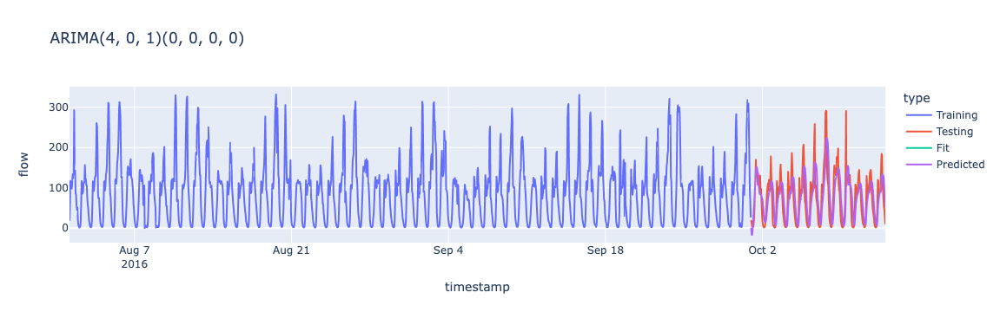

In [19]:
validate, predict, fig = validate_arima(model, df, train, test, add_feats)
fig

## SARIMAX

### `m = 2`

In [44]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   # start_p=1, start_q=1,
                   m=2,
                   # start_P=0, start_Q=0,
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[2] intercept   : AIC=1615.924, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[2] intercept   : AIC=1662.928, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[2] intercept   : AIC=1612.253, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[2] intercept   : AIC=1612.216, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[2]             : AIC=2202.904, Time=0.00 sec
 ARIMA(0,0,1)(0,0,0)[2] intercept   : AIC=1623.763, Time=0.02 sec
 ARIMA(0,0,1)(1,0,1)[2] intercept   : AIC=1613.938, Time=0.10 sec
 ARIMA(0,0,1)(0,0,2)[2] intercept   : AIC=1613.744, Time=0.03 sec


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

 ARIMA(0,0,1)(1,0,0)[2] intercept   : AIC=1612.609, Time=0.07 sec
 ARIMA(0,0,1)(1,0,2)[2] intercept   : AIC=1615.421, Time=0.17 sec
 ARIMA(0,0,0)(0,0,1)[2] intercept   : AIC=1651.527, Time=0.02 sec


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

 ARIMA(1,0,1)(0,0,1)[2] intercept   : AIC=1613.681, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[2] intercept   : AIC=1612.181, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[2] intercept   : AIC=1611.172, Time=0.03 sec
 ARIMA(1,0,0)(1,0,1)[2] intercept   : AIC=1614.205, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[2] intercept   : AIC=1613.073, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[2]             : AIC=1668.315, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[2] intercept
Total fit time: 0.938 seconds


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

RMSE: 10.484052697555882
MAE: 7.495161961887269


/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anaconda3/envs/ev-load-forecast-nyc/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/kimsha/anacon

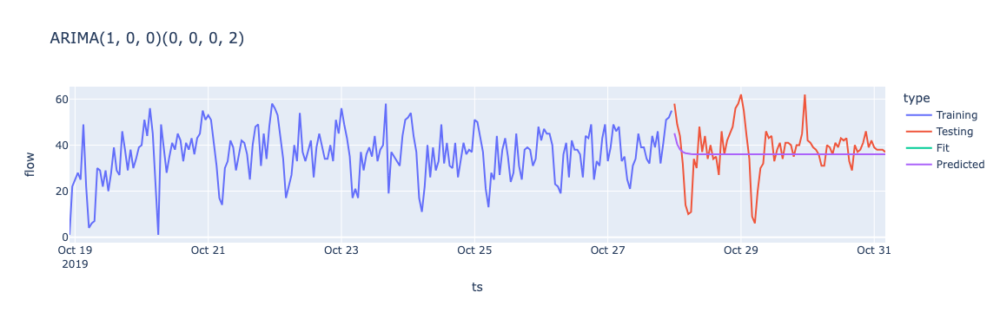

In [45]:
validate, predict, fig = validate_arima(model, df, train, test, add_feats)
fig

In [20]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   # start_p=1, start_q=1,
                   m=2,
                   # start_P=0, start_Q=0,
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[2] intercept   : AIC=13924.935, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[2] intercept   : AIC=15604.004, Time=0.34 sec
 ARIMA(1,0,0)(1,0,0)[2] intercept   : AIC=14090.128, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[2] intercept   : AIC=14141.277, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[2]             : AIC=15638.711, Time=0.36 sec
 ARIMA(1,0,1)(0,0,1)[2] intercept   : AIC=13927.934, Time=1.13 sec
 ARIMA(1,0,1)(1,0,0)[2] intercept   : AIC=13923.443, Time=1.01 sec
 ARIMA(1,0,1)(0,0,0)[2] intercept   : AIC=13959.121, Time=0.69 sec
 ARIMA(1,0,1)(2,0,0)[2] intercept   : AIC=13924.812, Time=1.50 sec
 ARIMA(1,0,1)(2,0,1)[2] intercept   : AIC=13893.486, Time=2.15 sec
 ARIMA(1,0,1)(2,0,2)[2] intercept   : AIC=13761.458, Time=2.32 sec
 ARIMA(1,0,1)(1,0,2)[2] intercept   : AIC=13925.420, Time=1.95 sec
 ARIMA(0,0,1)(2,0,2)[2] intercept   : AIC=14045.720, Time=1.52 sec
 ARIMA(1,0,0)(2,0,2)[2] intercept   : AIC=13896.638, Time=2.08 sec
 ARIMA(0,0,0)(2,0,2

RMSE: 29.92497333079928
MAE: 22.801719190903736


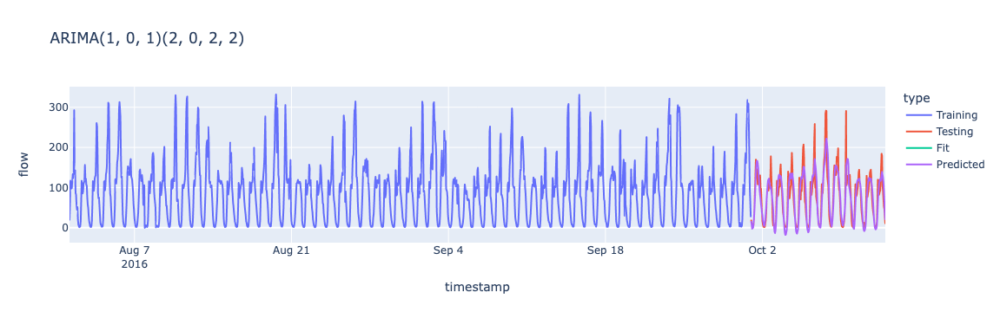

In [21]:
validate, predict, fig = validate_arima(model, df, train, test, add_feats)
fig

### `m = 24`

In [ ]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   # start_p=1, start_q=1,
                   m=24,
                   # start_P=0, start_Q=0,
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

In [ ]:
model.summary()

#### Validation

In [ ]:
training_fit = pd.DataFrame(model.predict_in_sample(train[add_feats]),
                            index=train.index, columns=['flow'])
training_fit['type'] = "Fit"

In [ ]:
predict = pd.DataFrame(model.predict(n_periods=len(test),
                                     X=test[add_feats]),
                       index=test.index, columns=['flow'])
predict['type'] = "Predicted"

In [ ]:
validate = pd.concat([df, training_fit, predict])

In [ ]:
px.line(validate, y='flow', color='type')

In [ ]:
print("RMSE:", np.sqrt(((test.flow - predict.flow)**2).mean()))
print("MAE:", abs(test.flow - predict.flow).mean())

# Parking Durations

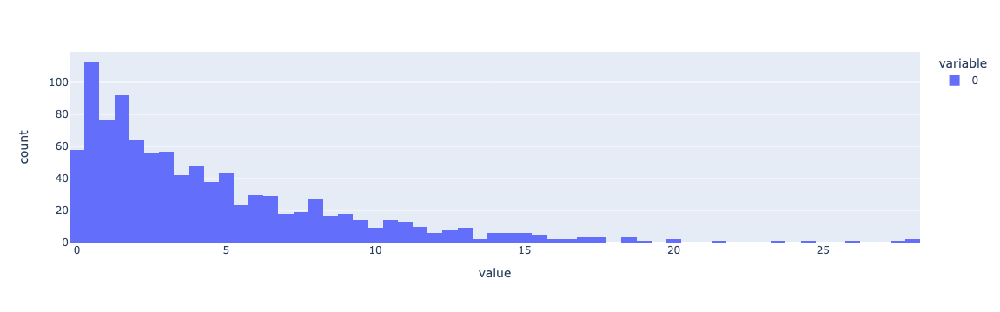

In [22]:
avg_charge_duration = 4.59
px.histogram(np.random.exponential(avg_charge_duration, size=1000), nbins=100)

In [23]:
assert predict.equals(predict.sort_index())

predict['flow'] = predict.flow.clip(lower=0).round().astype(int)

In [24]:
def generate_charge_time(row):
    durations = pd.to_timedelta(np.random.exponential(avg_charge_duration, size=row['flow']),
                                unit='hours')
    return pd.Series(-1, index=(row.name + durations), name='test')
    

In [25]:
exit_times = predict.progress_apply(lambda row: generate_charge_time(row), axis=1)\
                    .unstack().dropna().droplevel(1).to_frame('flow')

  0%|          | 0/288 [00:00<?, ?it/s]

In [26]:
exit_times['type'] = 'Exit'

In [27]:
df = pd.concat([predict, exit_times]).sort_index()

In [28]:
df['net_flow'] = df.flow.cumsum()
df['cum_inflow'] = df.mask(df.flow<0).fillna(0).flow.cumsum()
df['cum_outflow'] = df.mask(df.flow>=0).fillna(0).flow.cumsum()

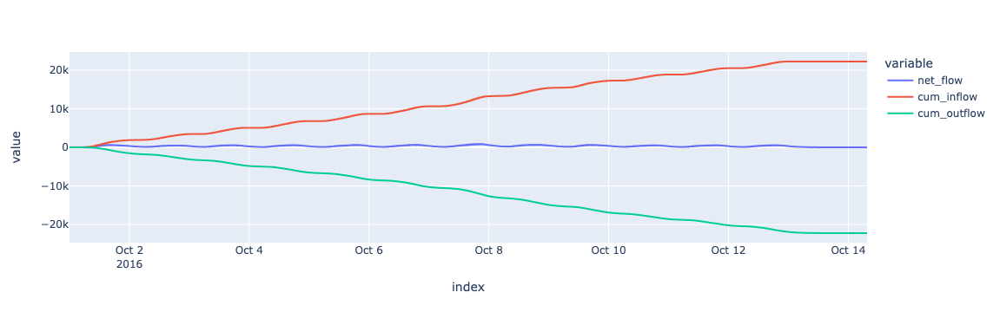

In [29]:
px.line(df, y=['net_flow', 'cum_inflow', 'cum_outflow'])